In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

# End-to-end Multi-Class Dog breed classification

## 1. Problem

Identifying the breed of a dog given an image

## 2. Data

Data is from Kaggle dog breed identification

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image

## 4. Features

* We're dealing with images (unstructured data) so we use deep learning/transfer learning.

* There are 10000+ images in training set(labels)

* There are 10000+ images in test set(unlabeled)


# Get our workspace ready

* Import TensorFlow
* Import TensorFlow Hub
* Make sure we're using GPU

In [1]:
# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ", tf.__version__)
print("TF Hub version: ", hub.__version__)

# Check for GPU availaibilty
print("GPU", "availaible(YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not availaible :(")

TF version:  2.15.0
TF Hub version:  0.16.1
GPU not availaible :(


## Getting our data ready (turning into Tensors)

With all ml models, our data has to be in numerical format. Turning our images into Tensors

Lets start by accesing our data and checking out the labels

In [2]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


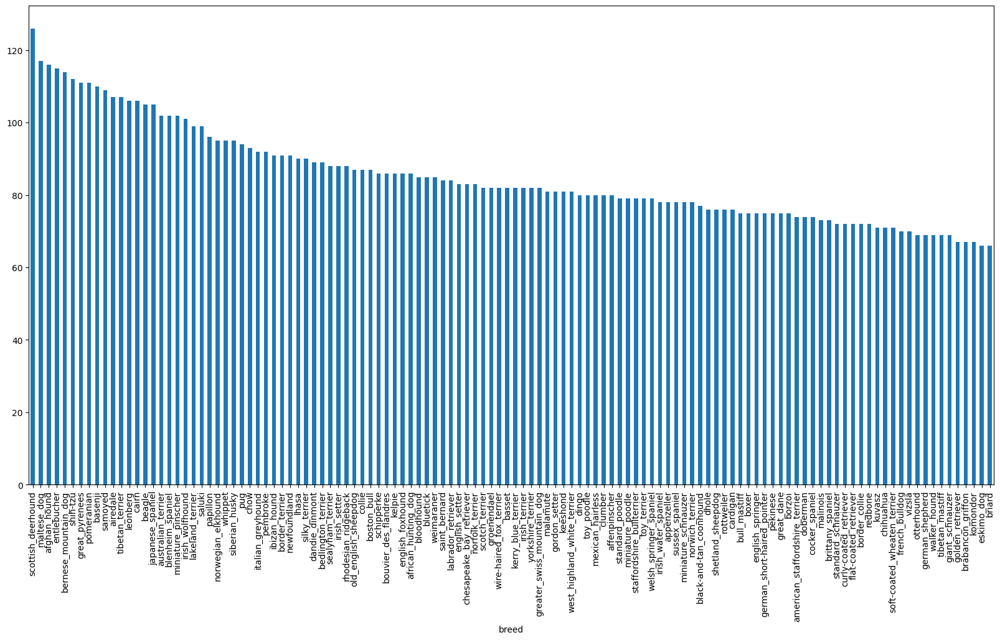

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

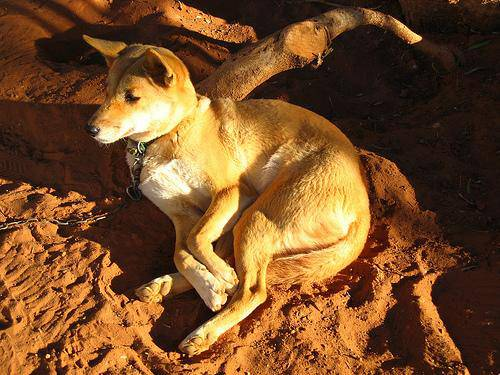

In [8]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [3]:
# Create pathnames from image IDs
filenames = ["drive/My Drive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

print(len(filenames))
# Check the first 10
filenames[:10]

10222


['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [4]:
# Check whether number of filenames mathes actual number of actual image files
import os
print(len(os.listdir("drive/My Drive/Dog Vision/train/")))
if len(os.listdir("drive/My Drive/Dog Vision/train/")) == len(filenames):
  print("proceed")
else:
  print("check target directory")

10222
proceed


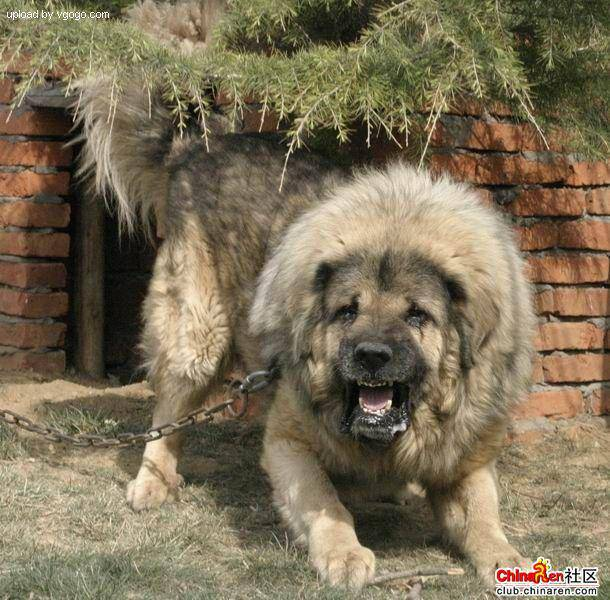

In [9]:
# Let's check otherwise
Image(filenames[9000])

In [10]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [11]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [12]:
len(labels)

10222

In [13]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Matches")
else:
  print("Sorry")

Matches


In [14]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [15]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [16]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [17]:
len(boolean_labels)

10222

In [18]:
# Example: Turning boolean array into integers
print(labels[0]) # original labels
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set


In [19]:
# Setup x and y variables
x = filenames
y = boolean_labels


In [20]:
len(x), len(y)

(10222, 10222)

We're going to start off with ~ 1000 images and increase as needed

In [21]:
# Set number  of images for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [22]:
# Let's split our data in train and validation
from sklearn.model_selection import train_test_split

# split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [23]:
# Let's have a geez at the training data
x_train[:2], y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, F

## Preprocessing Images (Turning images into Tensors)

We're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape pf(224,224)
5. Return the modified `image`

In [24]:
# Convert an image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

In [ ]:
image[:2]

In [ ]:
# Turn image into Tensor
tf.constant(image[:2])

Now we've seen what an image looks in Tensors, let's make a function to preprocess them

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image channels to 0-1
5. Resize the `image` to be a shape of(224,224)
6. Return the modified `image`


In [39]:
# Define image size
IMG_SIZE =224

# Create a function for preprocessing images
def process_image(image_path):
  # Read an image
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical TEnsors with 3 color channels (R,B,G)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0 to 255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Everything might not fit once into the memory thats why we do about 32 at a time

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like `(image, label)`

In [ ]:
# Create a simple function to return a tuple(image, label)
def get_image_label(image_path, label):

  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(x[42]), tf.constant(y[42]))

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, lets make a function to turn all our data (x & y) into batches!

In [36]:
# Define the batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  # If the data is a test dataset, we probably dont have labels
  if test_data:
    print("Creating thest data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we dont need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processot function is faster than shuffling
    data = data.shuffle(buffer_size=len(x))
    # Create (image,label) tuples
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [26]:
# Creating training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...


NameError: name 'get_image_label' is not defined

In [7]:
# Check out the different attributess of our data batches
train_data.element_spec, val_data.element_spec

NameError: name 'train_data' is not defined

## Visualizing Data Batches

Let's visualsie our data batches

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):

  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Dispaly an image
    plt.imshow(images[i])
    # Add the image label
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

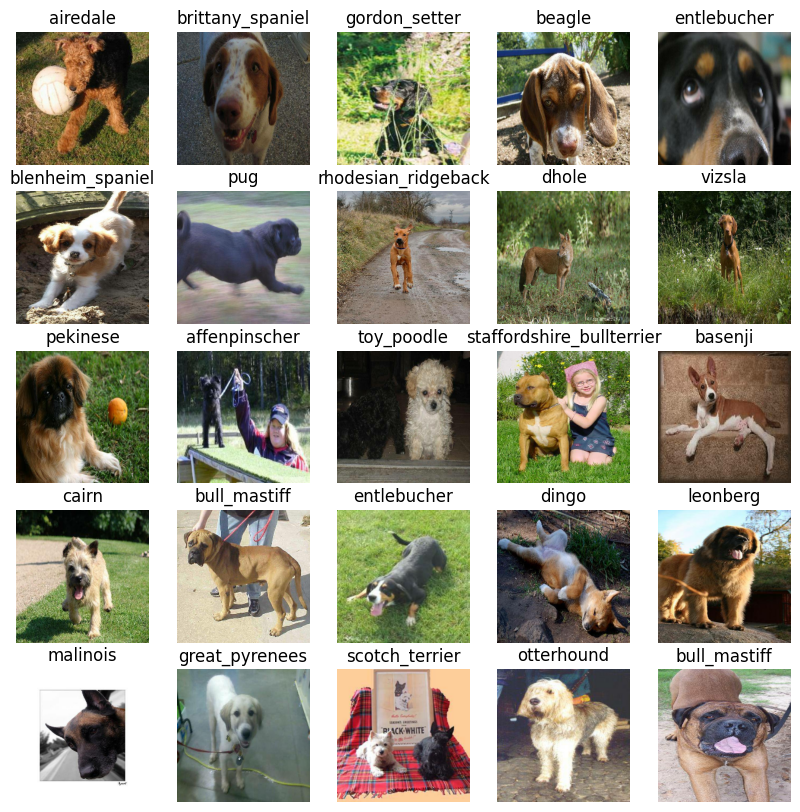

In [ ]:
# Now lets visualise the data in a training batch
show_25_images(train_images, train_labels)

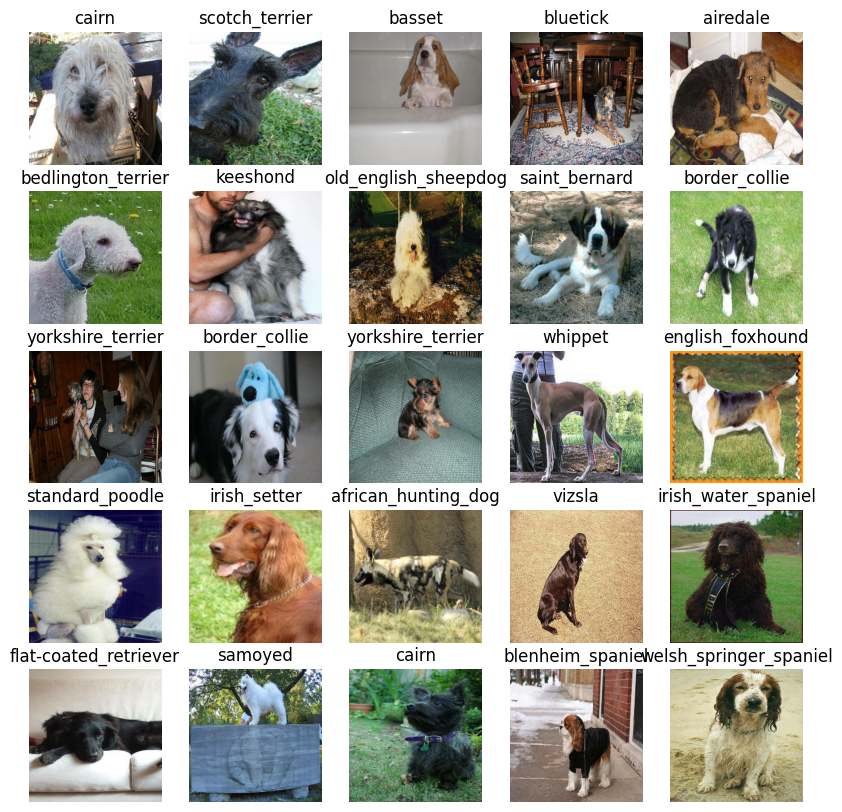

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape in the form of Tensors) to our mmodel.
* The output shape (image labels in the form of Tensors) of our model.
* The URL of the model we want to use

In [ ]:
# Setup imput shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our input outputs and model ready to go.
Let's put them together into Keras deep learning model

Lets create a function:
* Takes input shape, output shape and the model we've chosen parameters.
* Defines the layers in a Keras model in sequential fasion
* Compiles the model
* Builds the model
* Returns the model

In [ ]:
# Create a funcyion which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)
  ])

  # Compile a model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long

### TensorBoard Callbacks

To setup a TensorBoard callback we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualise our models training logs with the %tensorboard magic function

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

It hepls our model from overfitting by stopping training if a certain metric stops improving

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on a subset o f data)

Our first model is only going to train on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard using `create_tensoboard_callback()`
* Call the `fit()` function on our model passing it training data, validation data, nuber of epochs to train for(`NUM_EPOCHS`) and the callbacks
* Return the model

In [45]:
# Build a function to train and return the train model
def train_model():
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 297s 10s/step - loss: 4.5441 - accuracy: 0.1013 - val_loss: 3.5467 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 63s 3s/step - loss: 1.6237 - accuracy: 0.6875 - val_loss: 2.1872 - val_accuracy: 0.5050
Epoch 3/100
25/25 [==============================] - 54s 2s/step - loss: 0.5651 - accuracy: 0.9375 - val_loss: 1.7047 - val_accuracy: 0.5500
Epoch 4/100
25/25 [==============================] - 61s 2s/step - loss: 0.2559 - accuracy: 0.9875 - val_loss: 1.4759 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 64s 3s/step - loss: 0.1481 - accuracy: 0.9975 - val_loss: 1.3917 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 54s 2s/step - loss: 0.0995 - accuracy: 1.0000 - val_loss: 1.3532 - val_accuracy: 0.6400
Epoch 7/100
25/25 [==============================] - 52s 2

### Checking the TensorBoard logs
The TensorBoard magic function (`%tensorboard`) will acces the logs directory and visualise its content

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model

In [46]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

NameError: name 'model' is not defined

In [ ]:
predictions.shape

(200, 120)

In [ ]:
np.sum(predictions[0])

1.0000001

It would be better if we could see the image

In [47]:
# Turn prediction probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
#pred_label = get_pred_label(predictions[10])
#pred_label

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in a batch dataset we need to open it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels)

In [ ]:
# Create a function to open a batch dataset
def unbatchify(data):
  images = []
  labels = []
  # Loop through unbatche data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
  * Prediction labels
  * Validation labels (truth labels)
  * Validation images

Let's make some functions to make these all a bit more visualisable

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Chnage the color of the title depemding if th eprediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probility of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

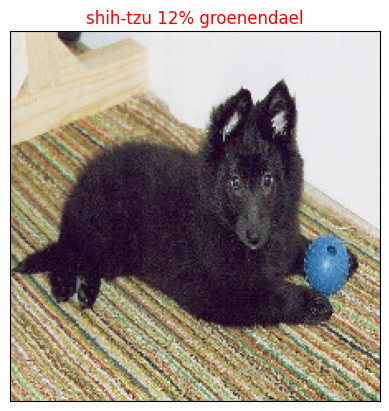

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualise our models top prediction, let's make another to view our models top 10 predictions:

This function will:
* Take an input of prediction probabilitites array and a ground truth array and an integer
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilitites values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the truelabel green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidene values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


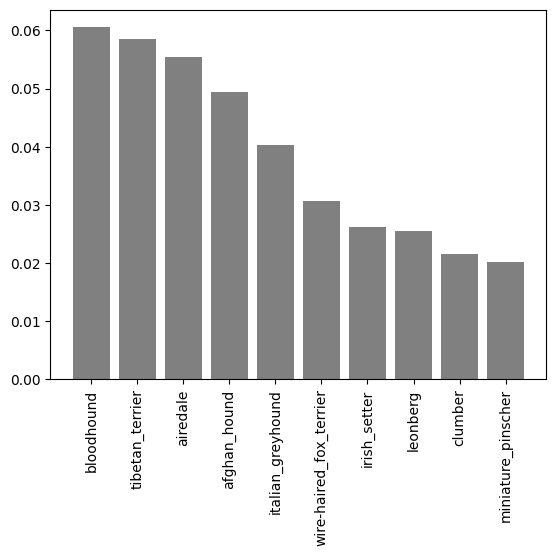

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate out model

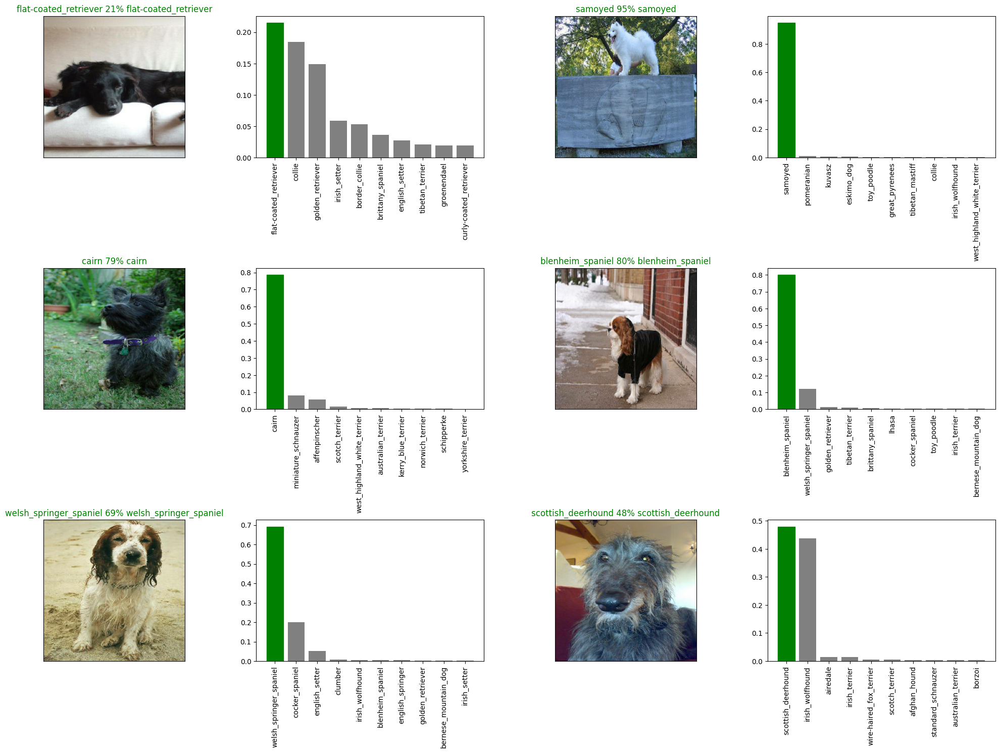

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model


In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  # Create a model dictionary pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [28]:
# Create a fuction to load a model
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                    custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Let's make sure they work

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20240527-142549-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20240527-142549-1000-images-mobilenetv2-Adam.h5'

In [29]:
# Load a trained model
loaded_1000_image_model = load_model('drive/My Drive/Dog Vision/models/20240527-142549-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/models/20240527-142549-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pred-saved model
model.evaluate(val_data)

7/7 [==============================] - 15s 2s/step - loss: 1.2390 - accuracy: 0.6500


[1.238956093788147, 0.6499999761581421]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 13s 2s/step - loss: 1.2390 - accuracy: 0.6500


[1.238956093788147, 0.6499999761581421]

## Training a model on full data

In [ ]:
len(x), len(y)

(10222, 10222)

In [ ]:
#  Create a data batch with the full dataset
full_data = create_data_batches(x, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 559s 2s/step - loss: 1.3271 - accuracy: 0.6740
Epoch 2/100
320/320 [==============================] - 570s 2s/step - loss: 0.3950 - accuracy: 0.8818
Epoch 3/100
320/320 [==============================] - 560s 2s/step - loss: 0.2343 - accuracy: 0.9347
Epoch 4/100
320/320 [==============================] - 557s 2s/step - loss: 0.1515 - accuracy: 0.9643
Epoch 5/100
320/320 [==============================] - 555s 2s/step - loss: 0.1052 - accuracy: 0.9790
Epoch 6/100
320/320 [==============================] - 572s 2s/step - loss: 0.0767 - accuracy: 0.9874
Epoch 7/100
320/320 [==============================] - 561s 2s/step - loss: 0.0576 - accuracy: 0.9914
Epoch 8/100
320/320 [==============================] - 558s 2s/step - loss: 0.0463 - accuracy: 0.9938
Epoch 9/100
320/320 [==============================] - 549s 2s/step - loss: 0.0371 - accuracy: 0.9963
Epoch 10/100
320/320 [==============================] - 564s 2s/step - loss: 0.031

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20240527-173943-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog Vision/models/20240527-173943-full-image-set-mobilenetv2-Adam.h5'

In [30]:
# Load in the full model
loaded_full_model = load_model('drive/My Drive/Dog Vision/models/20240527-173943-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/models/20240527-173943-full-image-set-mobilenetv2-Adam.h5


In [ ]:
len(x)

10222

## Making predictions on the dataset

Since our model is trained on images in the form of Tensor batches so to make predictions on the test data we'll have to get it int the same format

Luckily we created `create_data_batches(
)` earlier which can take a list of filenames as inout and convert them into Tensor batches

To make predictions on test data
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data()` parameter to `True` (since test data doesnto have labels)
* Make a predictions array by passing the test batches to the `predict()` method called on our model

In [32]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/784e628b81fe28ec1632cd8ed89909f8.jpg',
 'drive/MyDrive/Dog Vision/test/7852e7963247e079c2df5b542ba5db89.jpg',
 'drive/MyDrive/Dog Vision/test/78573c17964fb89fd99b0c65637e40a8.jpg',
 'drive/MyDrive/Dog Vision/test/785cbeacab81373e47633594b37ae3b5.jpg',
 'drive/MyDrive/Dog Vision/test/78676d2048c9b2cad3ecedb61c344136.jpg',
 'drive/MyDrive/Dog Vision/test/7868bda8b52226ccc50c5eb4f1d00d08.jpg',
 'drive/MyDrive/Dog Vision/test/786aec3e9ae71f6198bddf37c620bba3.jpg',
 'drive/MyDrive/Dog Vision/test/786c5d48f5b20a0ffbfa7cdfae09bf61.jpg',
 'drive/MyDrive/Dog Vision/test/786f4a8b04338a3896ae0c02e8a299ef.jpg',
 'drive/MyDrive/Dog Vision/test/7872772cffddd8a6e2af99c2200ff800.jpg']

In [33]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating thest data batches...


NameError: name 'process_image' is not defined

In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [34]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

NameError: name 'test_data' is not defined

In [35]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

NameError: name 'test_predictions' is not defined

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

## Preparing test dataset predictions for Kaggle

* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a CSV to submit to Kaggle

In [ ]:
#list(unique_breeds)

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,784e628b81fe28ec1632cd8ed89909f8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,7852e7963247e079c2df5b542ba5db89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,78573c17964fb89fd99b0c65637e40a8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,785cbeacab81373e47633594b37ae3b5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,78676d2048c9b2cad3ecedb61c344136,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Addnthe prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,784e628b81fe28ec1632cd8ed89909f8,5.935498e-12,1.393252e-12,1.183081e-12,1.503519e-09,1.296623e-14,2.364026e-10,1.729479e-14,5.768338e-13,4.284260e-10,...,1.360727e-14,3.795257e-12,5.950668e-11,9.958635e-07,9.299270e-14,1.537745e-05,1.664981e-12,3.586861e-12,1.358890e-11,6.533766e-13
1,7852e7963247e079c2df5b542ba5db89,1.360933e-09,9.112616e-09,1.716571e-10,5.486393e-05,1.706841e-07,1.176421e-05,5.079722e-08,1.866073e-07,4.381728e-11,...,5.434643e-08,9.027177e-05,2.995534e-04,2.099481e-09,1.259297e-07,1.439534e-09,5.859747e-10,4.569241e-08,2.429180e-05,5.243962e-07
2,78573c17964fb89fd99b0c65637e40a8,2.498971e-09,1.919124e-05,2.323902e-08,5.975483e-06,2.118375e-09,3.503153e-06,1.051218e-10,1.590440e-09,3.171444e-07,...,1.915085e-09,4.473631e-09,2.473208e-06,3.620007e-07,3.730206e-07,6.568926e-08,4.419949e-10,3.491205e-07,3.475220e-09,1.228951e-08
3,785cbeacab81373e47633594b37ae3b5,1.556904e-08,1.106353e-10,1.294735e-12,4.876589e-11,1.078394e-10,2.147957e-11,2.125774e-13,5.600326e-10,2.374870e-11,...,2.380242e-09,2.980550e-11,1.018282e-09,1.752993e-12,1.563987e-12,6.077753e-13,9.720178e-12,3.178651e-13,4.960357e-09,8.561330e-10
4,78676d2048c9b2cad3ecedb61c344136,4.116017e-08,4.952793e-09,1.265800e-07,1.312100e-08,1.059930e-04,1.702775e-10,3.734198e-08,1.626714e-08,3.559974e-09,...,2.829503e-07,2.438417e-08,1.452606e-08,8.787520e-10,2.376741e-07,5.399929e-11,1.829488e-11,3.163144e-07,2.405144e-10,4.028952e-08


In [ ]:
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_mobilenetV2.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images
* Turn the filepaths into data batches using `create_data_batches()`.
* Pass the custom image data batch to our model's `predict()`
* Convert the prediction probabilities to labels
* Compare the predicted labels to custom images

In [37]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path +fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/pexels-valeriya-1805164.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/pexels-charlesdeluvio-1851164.jpg']

In [40]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating thest data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [41]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [ ]:
custom_preds.shape

(2, 120)

In [48]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['chow', 'pug']

In [ ]:
# Get custom images (our unbatchify() function wont work since there are no labels)
custom_images=[]
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

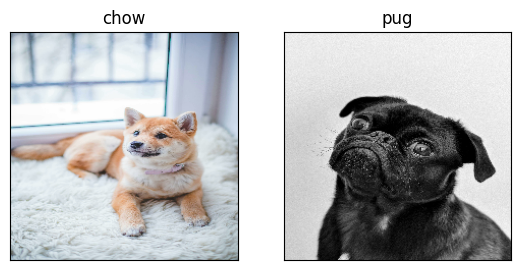

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)